In [144]:
from collections import defaultdict
from IPython.core.display import display, HTML
from learning_utils import pickle_load
import operator
display(HTML("<style>.container { width:100% !important; }</style>"))

In [146]:
from scipy.stats import norm
import pandas as pd
import numpy as np
models = list(range(3216))
control_pids = [1, 2, 6, 9, 11, 14, 18, 21, 24, 27, 37, 38, 44, 50, 55, 56, 58, 66, 76, 79, 85, 89, 90, 98, 99,
                100, 104, 111, 113, 118, 119, 123, 126, 129, 139, 142, 144, 153, 154]
obj = "mer_performance_error"
sigma = 1
nlls = defaultdict(dict)
diffs = defaultdict(dict)
for i, pid in enumerate(list(range(30))):
    print(pid)
    data = pd.DataFrame()
    for model in models:
        try:
            d = pickle_load(f"results/model_performance_error_c1.1/{pid}_{obj}_{model}.pkl")
            mean_data = d.groupby(["algo", "x"]).mean()
            algo_mean = mean_data['y']['algo'].values
            p_data = mean_data['y']['participant'].values
            diffs[pid][model] = np.sqrt(np.sum(algo_mean-p_data)**2)
            nlls[pid][model] = np.sum([-norm.logpdf(a_score, p_score, sigma) for a_score, p_score in zip(algo_mean, p_data)])
        except Exception as e:
            print(e)
            continue

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
results/model_performance_error_c1.1/23_mer_performance_error_0.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_2.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_3.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_4.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_5.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_6.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_7.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_8.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_9.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_10.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_11.pkl

results/model_performance_error_c1.1/23_mer_performance_error_1785.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1786.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1787.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1788.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1789.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1790.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1791.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1792.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1793.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1794.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1795.pkl not found.
results/model_performance_error_c1.1/23_mer_performance_error_1796.pkl not found.
results/model_pe

25
26
27
results/model_performance_error_c1.1/27_mer_performance_error_2773.pkl not found.
results/model_performance_error_c1.1/27_mer_performance_error_2834.pkl not found.
28
29
results/model_performance_error_c1.1/29_mer_performance_error_2325.pkl not found.
results/model_performance_error_c1.1/29_mer_performance_error_2383.pkl not found.


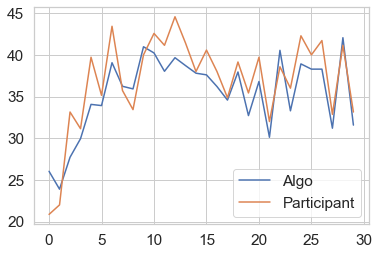

In [138]:
import matplotlib.pyplot as plt
M = pd.read_csv("rl_models.csv")
control_pids = [1, 2, 6, 9, 11, 14, 18, 21, 24, 27, 37, 38, 44, 50, 55, 56, 58, 66, 76, 79, 85, 89, 90, 98, 99,
                100, 104, 111, 113, 118, 119, 123, 126, 129, 139, 142, 144, 153, 154]
mod_control_pids = control_pids.copy()
for p in [79, 113, 126, 129]:
    mod_control_pids.remove(p)

mod_control_pids = list(range(20))

algos = []
ps = []
def key_with_min_val(d):
    return min(d.items(), key=operator.itemgetter(1))[0]

def get_keys_with_min_aic(d):
    min_aic = min(d.values())
    min_indices = [i for i, aic in d.items() if aic <= min_aic + 2]
    return min_indices

n_trials=30
indices = {}
for pid in mod_control_pids:
    d = nlls[pid]
    try:
        min_key = key_with_min_val(d)
        indices[pid] = get_keys_with_min_aic(d)
        d = pickle_load(f"results/model_performance_error/{pid}_{obj}_{min_key}.pkl")
        mean_data = d.groupby(["algo", "x"]).mean()
        algo_mean = mean_data['y']['algo'].values
        p_data = mean_data['y']['participant'].values
        if len(algo_mean) == n_trials:
            algos.append(algo_mean)
            ps.append(p_data)
        #print(pid, M.iloc[min_key])
    except Exception as e:
        continue
plt.plot(np.mean(algos, axis=0), label='Algo')
plt.plot(np.mean(ps, axis=0), label='Participant')
plt.legend()
plt.savefig("results/best_models.png")

In [139]:
df = pd.DataFrame()
for pid in mod_control_pids:
    print(pid)
    display(M.iloc[indices[pid]])
    temp_df = M.loc[indices[pid]]
    temp_df['pid'] = pid
    df = df.append(temp_df)
from IPython.display import FileLink
FileLink('best_models.md')

0


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
10,10,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,True,False,True,NaN,NaN,strategy_weight
12,12,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,False,True,True,NaN,NaN,strategy_weight
14,14,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,False,False,True,NaN,NaN,strategy_weight
18,18,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,False,True,True,False,True,NaN,NaN,strategy_weight
19,19,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,False,True,True,False,False,NaN,NaN,strategy_weight
26,26,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,False,False,True,False,True,NaN,NaN,strategy_weight
29,29,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,False,False,False,True,False,NaN,NaN,strategy_weight
66,66,hierarchical_learner,adaptive_satisficing,True,True,reinforce,True,NaN,NaN,NaN,NaN,True,True,True,False,True,NaN,NaN,strategy_weight
67,67,hierarchical_learner,adaptive_satisficing,True,True,reinforce,True,NaN,NaN,NaN,NaN,True,True,True,False,False,NaN,NaN,strategy_weight
68,68,hierarchical_learner,adaptive_satisficing,True,True,reinforce,True,NaN,NaN,NaN,NaN,True,True,False,True,True,NaN,NaN,strategy_weight


1


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
564,564,hierarchical_learner,adaptive_satisficing,False,False,baseline_reinforce,False,NaN,NaN,NaN,NaN,False,True,False,True,True,NaN,NaN,strategy_weight


2


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
1894,1894,reinforce,NaN,False,False,NaN,True,NaN,NaN,NaN,NaN,True,True,False,False,True,NaN,NaN,strategy_weight
2863,2863,sdss,NaN,False,False,NaN,True,rssl,lvoc,NaN,True,True,False,False,False,False,False,True,strategy_weight


3


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
2461,2461,sdss,NaN,True,False,NaN,True,rssl,lvoc,NaN,True,True,True,False,False,True,False,True,strategy_weight


4


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
1869,1869,reinforce,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,True,False,False,True,False,NaN,NaN,strategy_weight


5


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
0,0,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,True,True,NaN,NaN,strategy_weight
1,1,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,True,False,NaN,NaN,strategy_weight
2,2,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,False,True,NaN,NaN,strategy_weight
3,3,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,False,False,NaN,NaN,strategy_weight
4,4,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,True,True,NaN,NaN,strategy_weight
5,5,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,True,False,NaN,NaN,strategy_weight
6,6,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,False,True,NaN,NaN,strategy_weight
7,7,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,False,False,NaN,NaN,strategy_weight
8,8,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,True,True,True,NaN,NaN,strategy_weight
9,9,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,True,True,False,NaN,NaN,strategy_weight


6


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
416,416,hierarchical_learner,adaptive_satisficing,False,False,lvoc,False,NaN,NaN,NaN,NaN,True,True,True,True,True,NaN,NaN,strategy_weight
1734,1734,lvoc,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,True,True,False,False,True,NaN,NaN,strategy_weight
1745,1745,lvoc,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,False,True,True,True,False,NaN,NaN,strategy_weight
1782,1782,lvoc,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,False,True,False,False,True,NaN,NaN,strategy_weight
1871,1871,reinforce,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,True,False,False,False,False,NaN,NaN,strategy_weight
1885,1885,reinforce,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,False,False,False,True,False,NaN,NaN,strategy_weight
1932,1932,baseline_reinforce,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,True,False,False,True,True,NaN,NaN,strategy_weight
1980,1980,baseline_reinforce,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,False,False,False,True,True,NaN,NaN,strategy_weight
1981,1981,baseline_reinforce,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,False,False,False,True,False,NaN,NaN,strategy_weight
2499,2499,sdss,NaN,True,False,NaN,True,rssl,lvoc,NaN,True,False,False,True,True,False,False,True,strategy_weight


7


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
1486,1486,hierarchical_learner,confidence_bound,True,False,baseline_reinforce,True,NaN,NaN,NaN,NaN,True,False,False,False,True,NaN,NaN,strategy_weight
1898,1898,reinforce,NaN,False,False,NaN,True,NaN,NaN,NaN,NaN,True,False,True,False,True,NaN,NaN,strategy_weight


8


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
2112,2112,sdss,NaN,True,True,NaN,True,rssl,lvoc,NaN,True,False,False,True,True,True,True,True,strategy_weight


9


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
0,0,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,True,True,NaN,NaN,strategy_weight
1,1,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,True,False,NaN,NaN,strategy_weight
2,2,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,False,True,NaN,NaN,strategy_weight
3,3,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,False,False,NaN,NaN,strategy_weight
4,4,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,True,True,NaN,NaN,strategy_weight
5,5,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,True,False,NaN,NaN,strategy_weight
6,6,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,False,True,NaN,NaN,strategy_weight
7,7,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,False,False,NaN,NaN,strategy_weight
8,8,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,True,True,True,NaN,NaN,strategy_weight
9,9,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,True,True,False,NaN,NaN,strategy_weight


10


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
149,149,hierarchical_learner,adaptive_satisficing,True,True,baseline_reinforce,True,NaN,NaN,NaN,NaN,False,True,False,True,False,NaN,NaN,strategy_weight
475,475,hierarchical_learner,adaptive_satisficing,False,False,reinforce,True,NaN,NaN,NaN,NaN,False,False,True,False,False,NaN,NaN,strategy_weight
1831,1831,reinforce,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,True,True,False,False,False,NaN,NaN,strategy_weight
1876,1876,reinforce,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,False,True,False,True,True,NaN,NaN,strategy_weight
1885,1885,reinforce,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,False,False,False,True,False,NaN,NaN,strategy_weight
1941,1941,baseline_reinforce,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,False,True,False,True,False,NaN,NaN,strategy_weight
1952,1952,baseline_reinforce,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,True,True,True,True,True,NaN,NaN,strategy_weight


11


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
76,76,hierarchical_learner,adaptive_satisficing,True,True,reinforce,True,NaN,NaN,NaN,NaN,True,False,False,True,True,NaN,NaN,strategy_weight
325,325,hierarchical_learner,adaptive_satisficing,True,False,baseline_reinforce,True,NaN,NaN,NaN,NaN,True,True,False,True,False,NaN,NaN,strategy_weight
513,513,hierarchical_learner,adaptive_satisficing,False,False,baseline_reinforce,True,NaN,NaN,NaN,NaN,True,True,True,True,False,NaN,NaN,strategy_weight
839,839,hierarchical_learner,threshold,True,False,reinforce,True,NaN,NaN,NaN,NaN,True,True,False,False,False,NaN,NaN,strategy_weight
843,843,hierarchical_learner,threshold,True,False,reinforce,True,NaN,NaN,NaN,NaN,True,False,True,False,False,NaN,NaN,strategy_weight
919,919,hierarchical_learner,threshold,True,False,baseline_reinforce,True,NaN,NaN,NaN,NaN,False,True,False,False,False,NaN,NaN,strategy_weight
1088,1088,hierarchical_learner,threshold,False,False,baseline_reinforce,True,NaN,NaN,NaN,NaN,True,True,True,True,True,NaN,NaN,strategy_weight
1097,1097,hierarchical_learner,threshold,False,False,baseline_reinforce,True,NaN,NaN,NaN,NaN,True,False,True,True,False,NaN,NaN,strategy_weight
1855,1855,reinforce,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,False,False,False,False,False,NaN,NaN,strategy_weight
1948,1948,baseline_reinforce,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,False,False,False,True,True,NaN,NaN,strategy_weight


12


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
1734,1734,lvoc,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,True,True,False,False,True,NaN,NaN,strategy_weight


13


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
0,0,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,True,True,NaN,NaN,strategy_weight
1,1,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,True,False,NaN,NaN,strategy_weight
2,2,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,False,True,NaN,NaN,strategy_weight
3,3,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,False,False,NaN,NaN,strategy_weight
4,4,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,True,True,NaN,NaN,strategy_weight
5,5,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,True,False,NaN,NaN,strategy_weight
6,6,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,False,True,NaN,NaN,strategy_weight
7,7,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,False,False,NaN,NaN,strategy_weight
8,8,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,True,True,True,NaN,NaN,strategy_weight
9,9,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,True,True,False,NaN,NaN,strategy_weight


14


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
2106,2106,sdss,NaN,True,True,NaN,True,rssl,lvoc,NaN,True,False,True,False,True,False,True,True,strategy_weight


15


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
1990,1990,baseline_reinforce,NaN,False,False,NaN,True,NaN,NaN,NaN,NaN,True,True,False,False,True,NaN,NaN,strategy_weight


16


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
1951,1951,baseline_reinforce,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,False,False,False,False,False,NaN,NaN,strategy_weight


17


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
1760,1760,lvoc,NaN,True,False,NaN,True,NaN,NaN,NaN,NaN,True,True,True,True,True,NaN,NaN,strategy_weight


18


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
0,0,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,True,True,NaN,NaN,strategy_weight
1,1,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,True,False,NaN,NaN,strategy_weight
2,2,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,False,True,NaN,NaN,strategy_weight
3,3,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,True,False,False,NaN,NaN,strategy_weight
4,4,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,True,True,NaN,NaN,strategy_weight
5,5,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,True,False,NaN,NaN,strategy_weight
6,6,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,False,True,NaN,NaN,strategy_weight
7,7,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,True,False,False,False,NaN,NaN,strategy_weight
8,8,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,True,True,True,NaN,NaN,strategy_weight
9,9,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,NaN,NaN,True,False,True,True,False,NaN,NaN,strategy_weight


19


,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,selector,learner,strategy_space_type,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,bandit_prior,prior
511,511,hierarchical_learner,adaptive_satisficing,False,False,reinforce,False,NaN,NaN,NaN,NaN,False,False,False,False,False,NaN,NaN,strategy_weight


/Users/yjain/modeling_mcl/python/best_models.md

In [140]:
nunique = df.apply(pd.Series.nunique)
cols_to_drop = nunique[nunique == 1].index
df = df.drop(cols_to_drop, axis=1)
display(df)

,Unnamed: 0,model,decision_rule,use_pseudo_rewards,pr_weight,actor,term,learner,stochastic_updating,subjective_cost,vicarious_learning,termination_value_known,montecarlo_updates,is_null,is_gaussian,prior,pid
10,10,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,True,False,True,False,True,NaN,strategy_weight,0
12,12,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,True,False,False,True,True,NaN,strategy_weight,0
14,14,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,True,False,False,False,True,NaN,strategy_weight,0
18,18,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,False,True,True,False,True,NaN,strategy_weight,0
19,19,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,False,True,True,False,False,NaN,strategy_weight,0
26,26,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,False,False,True,False,True,NaN,strategy_weight,0
29,29,hierarchical_learner,adaptive_satisficing,True,True,lvoc,True,NaN,NaN,False,False,False,True,False,NaN,strategy_weight,0
66,66,hierarchical_learner,adaptive_satisficing,True,True,reinforce,True,NaN,NaN,True,True,True,False,True,NaN,strategy_weight,0
67,67,hierarchical_learner,adaptive_satisficing,True,True,reinforce,True,NaN,NaN,True,True,True,False,False,NaN,strategy_weight,0
68,68,hierarchical_learner,adaptive_satisficing,True,True,reinforce,True,NaN,NaN,True,True,False,True,True,NaN,strategy_weight,0


### Models selected

In [141]:
import seaborn as sns
from collections import Counter
criteria = ['model', 'decision_rule', 'actor', 'learner', 'is_null', 'subjective_cost', 'pr_weight', 'term']
df_tuple = list(zip(*[df[criterion] for criterion in criteria]))
model_pairs = list(df_tuple)
model_pairs_counts = dict(Counter(model_pairs))

group_df = df.groupby(['pid'] + criteria)
pid_models = defaultdict(set)
for k, v in group_df.groups.items():
    pid_models[k[0]].add(k[1:])
    
counts = defaultdict(int)
pids = set(df['pid'])
for pid in pids:
    for model_attrs in model_pairs_counts:
        if model_attrs in pid_models[pid]:
            counts[model_attrs] += 1

In [142]:
L = []
for k, v in counts.items():
    L.append(list(k) + [v])
summary_df = pd.DataFrame(L, columns=criteria+['count'])
summary_df = summary_df.sort_values(by='count', ascending=False)

In [143]:
pd.options.display.max_rows = 9999
display(summary_df)

,model,decision_rule,actor,learner,is_null,subjective_cost,pr_weight,term,count
96,baseline_reinforce,NaN,NaN,NaN,True,True,False,True,8
99,baseline_reinforce,NaN,NaN,NaN,False,False,False,True,7
88,reinforce,NaN,NaN,NaN,True,True,False,True,7
89,reinforce,NaN,NaN,NaN,False,True,False,True,7
95,baseline_reinforce,NaN,NaN,NaN,False,False,True,True,7
91,reinforce,NaN,NaN,NaN,False,False,False,True,7
76,lvoc,NaN,NaN,NaN,True,True,True,True,7
73,hierarchical_learner,confidence_bound,baseline_reinforce,NaN,True,True,False,True,6
83,lvoc,NaN,NaN,NaN,True,False,False,True,6
85,reinforce,NaN,NaN,NaN,False,True,True,True,6
